# **Fully Automated Weather Data Visualization Script**

This is the fully automated version of the weather visualization script. In this version, you only need to answer a few questions at the beginning. Once the questions are answered, you can simply run all cells in the notebook at once to download, process, and visualize the data. After answering all questions, scroll all the way down to look at the animation. You can also download the animation by clicking on the folder button on the left. There you should find your animation, if you have set the option to save as mp4 to 'yes'.

If you prefer a more detailed, step-by-step explanation of the process, you can check out the interactive version of this script [here](#).

---

### **User-Defined Options**
The following settings can be customized at the start of the script:

1. **Atmospheric Variable**:
   - Choose one of the following:
     - `temperature`
     - `relative humidity`
     - `wind`
     - `rain`
     - `low clouds`
     - `high clouds`
     - `snow`
   - Example: `high clouds`

2. **Year**:
   - Enter a year within the range of 1981–2015.
   - Example: `1997`

3. **Date Range**:
   - Define the time period for the visualization:
     - **Start Date**: Format `MM-DD` (e.g., `04-27`)
     - **End Date**: Format `MM-DD` (e.g., `04-28`)

4. **Color Palette**:
   - Choose a colormap for the visualization from the following:
     - `viridis`, `plasma`, `inferno`, `magma`, `cividis`
   - Example: `plasma`

5. **World Map Overlay**:
   - Specify whether to overlay a world map on the data:
     - `yes` or `no`
   - Example: `yes`

6. **Advanced Settings**:
   - If you want to customize advanced settings, choose `yes`. Otherwise, choose `no`.

   - **Advanced Options** (enabled if `yes` is selected):
     - **Latitude Range**:
       - `lat_min`: Minimum latitude (`-90` to `90`).
       - `lat_max`: Maximum latitude (`-90` to `90`).
       - Example: `lat_min = -15`, `lat_max = 15`
     - **Longitude Range**:
       - `lon_min`: Minimum longitude (`-180` to `180`).
       - `lon_max`: Maximum longitude (`-180` to `180`).
       - Example: `lon_min = -50`, `lon_max = 50`
     - **Axis Visibility**:
       - Whether to include axis labels on the plot:
         - `yes` or `no`
       - Example: `yes`
     - **Time Selection**:
       - Choose to plot:
         - **Each timestep**: `each`
         - **A specific hour of the day**: `specific`
       - If `specific`, select the hour (e.g., `0, 3, 6, 9, 12, 15, 18, 21`).
       - Example: `specific hour = 6`

---

### **Example of User Choices**
Here’s an example of how the settings might look after being configured:
- Variable: `high clouds`
- Year: `1997`
- Date Range: Start Date = `04-27`, End Date = `04-28`
- Color Palette: `plasma`
- World Map: `yes`
- Advanced Settings: Enabled (`yes`)
  - Latitude Range: `lat_min = -15`, `lat_max = 15`
  - Longitude Range: `lon_min = -50`, `lon_max = 50`
  - Axis: `yes`
  - Specific Hour: `6`
- Save Animation: `no`

**You chose**: `high clouds` with the color palette `plasma` for the year `1997`, world map plotted: `yes`, start date: `04-27`, end date: `04-28`.  
**Advanced settings**: `lat_min = -15`, `lat_max = 15`, `lon_min = -50`, `lon_max = 50`, specific hour = `6`, axis = `yes`.

---

Simply update the options above as needed and run the entire script to generate your visualization.


In [ ]:
import datetime
import matplotlib.pyplot as plt

options = ['temperature', 'relative humidity', 'wind', 'rain', 'low clouds', 'high clouds', 'snow']
#color_palettes = ['viridis', 'plasma', 'inferno', 'magma', 'cividis']
color_palettes = plt.colormaps()
valid_years = range(1981, 2016)  # range of valid years
yes_no_options = ['yes', 'no']
each_specific = ['each', 'specific']
hours_of_day = ['0', '3', '6', '9', '12', '15', '18', '21']
lat_range = range(-90, 91)
lon_range = range(-180, 181)

def get_valid_input(prompt, valid_options):
    while True:
        user_input = input(prompt).strip()
        try:
            if isinstance(valid_options, range):
                user_input = int(user_input)
            if user_input in valid_options:
                return user_input
        except ValueError:
            pass
        print(f"Invalid input. Please choose from: {', '.join(map(str, valid_options))}")

def get_valid_date(prompt):
    while True:
        user_input = input(prompt).strip()
        try:
            month, day = map(int, user_input.split('-'))
            date = datetime.datetime(2022, month, day)  # Using a non-leap year to validate month-date
            return date, f"{month:02d}-{day:02d}"
        except ValueError:
            print("Invalid date. Please enter a valid date in MM-DD format.")

# Ask for a specific datetime to save as PNG
def get_valid_datetime(prompt, start_dt, end_dt, valid_hours):
    while True:
        user_input = input(prompt).strip()
        try:
            month, day, hour = map(int, user_input.split('-'))
            test_dt = datetime.datetime(year, month, day, hour)
            if start_dt <= test_dt <= end_dt and str(hour) in valid_hours:
                return test_dt
            else:
                print(f"The datetime must be within the animation range ({start_date_str} to {end_date_str}) and hour must be one of: {', '.join(valid_hours)}")
        except ValueError:
            print("Invalid input. Please enter the datetime in MM-DD-HH format.")




def ask_advanced_settings():

    lat_min = get_valid_input("Enter latitude min (-90 to 90): ", lat_range)
    while True:
        lat_max = get_valid_input("Enter latitude max ("+str(lat_min)+" to 90): ", lat_range)
        if lat_max > lat_min:
            break
        else:
            print("Latitude max must be greater than latitude min. Please enter valid values.")

    lon_min = get_valid_input("Enter longitude min (-180 to 180): ", lon_range)
    while True:
        lon_max = get_valid_input("Enter longitude max ("+str(lon_min)+" to 180): ", lon_range)
        if lon_max > lon_min:
            break
        else:
            print("Longitude max must be greater than longitude min. Please enter valid values.")

    axis = get_valid_input("Do you want to plot with axis or not (yes/no): ", yes_no_options)
    specific_hour = get_valid_input("Do you want to plot each time step or a specific hour of the day (each/specific): ", each_specific)
    hour = None
    if specific_hour == 'specific':
        hour = get_valid_input("Which hour of the day (0, 3, 6, 9, 12, 15, 18, 21): ", hours_of_day)
        hour = int(hour)


    return lat_min, lat_max, lon_min, lon_max, hour, axis

# Initial inputs
variable_prompt = f"Choose a variable ({', '.join(options)}): "
year_prompt = f"Choose a year ({min(valid_years)}-{max(valid_years)}): "
start_date_prompt = "Enter start date (MM-DD): "
end_date_prompt = "Enter end date (MM-DD): "
color_palette_prompt = f"Choose a color palette ({', '.join(color_palettes[:6])} ...): "
world_map_prompt = "With world map plotted on the data? (yes/no): "

variable = get_valid_input(variable_prompt, options)
year = get_valid_input(year_prompt, valid_years)
start_date_dt, start_date_str = get_valid_date(start_date_prompt)
while True:
    end_date_dt, end_date_str = get_valid_date(end_date_prompt)
    if end_date_dt > start_date_dt:
        break
    else:
        print("End date must be after the start date. Please enter a valid end date.")

color_palette = get_valid_input(color_palette_prompt, color_palettes)
world_map = get_valid_input(world_map_prompt, yes_no_options)

save_datetime_prompt = f"Enter the date and hour to save as PNG (MM-DD-HH), hour must be one of ({', '.join(hours_of_day)}): "
save_datetime = get_valid_datetime(save_datetime_prompt, start_date_dt.replace(year=year), end_date_dt.replace(year=year), hours_of_day)

# Advanced settings
advanced_settings_prompt = "Do you want to change any special settings? (yes/no): "
advanced_settings = get_valid_input(advanced_settings_prompt, yes_no_options)

if advanced_settings == 'yes':
    lat_min, lat_max, lon_min, lon_max, hour, axis = ask_advanced_settings()
else:
    lat_min, lat_max, lon_min, lon_max, hour, axis = -90, 90, -180, 179,  'no','no'

print(f"You chose: {variable} with the color palette: {color_palette} for the year: {year}, world map plotted: {world_map}, start date: {start_date_str}, end date: {end_date_str}")
if advanced_settings == 'yes':
    print(f"Advanced settings: lat_min={lat_min}, lat_max={lat_max}, lon_min={lon_min}, lon_max={lon_max}, specific hour={hour}, axis={axis}")
else:
    print("No advanced settings chosen.")


Choose a variable (temperature, relative humidity, wind, rain, low clouds, high clouds, snow): high clouds
Choose a year (1981-2015): 1999
Enter start date (MM-DD): 04-2
Enter end date (MM-DD): 04-3
Choose a color palette (magma, inferno, plasma, viridis, cividis, twilight ...): Blues
With world map plotted on the data? (yes/no): no
Enter the date and hour to save as PNG (MM-DD-HH), hour must be one of (0, 3, 6, 9, 12, 15, 18, 21): 04-02-03
Do you want to change any special settings? (yes/no): no
You chose: high clouds with the color palette: Blues for the year: 1999, world map plotted: no, start date: 04-02, end date: 04-03
No advanced settings chosen.


In [ ]:
# load the required packages
# Check if cartopy is installed and install it if not
try:
    import cartopy
    print("Cartopy is already installed.")
except ImportError:
    print("Cartopy is not installed. Installing now...")
    !pip install cartopy
    import cartopy
    print("Cartopy has been installed.")

import os
import requests
import xarray as xr
import matplotlib.pyplot as plt
import urllib.request
import glob
import matplotlib.animation as animation
import numpy as np
from IPython.display import HTML
import warnings
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import io

Cartopy is already installed.


In [ ]:
# download the data

## 2m air temperature
if variable == 'temperature':
  dataset = 'air.2m.'+str(year)+'.nc' ### insert the name of the dataset you want to download
  url = f'https://downloads.psl.noaa.gov/Datasets/20thC_ReanV3/2mMO/'+dataset ### copy and paste the url of the dataset

## wind in north-south direction
if variable == 'wind':
  dataset = 'vwnd.10m.'+str(year)+'.nc'
  url = f'https://downloads.psl.noaa.gov/Datasets/20thC_ReanV3/10mMO/'+dataset

## relative humidity
if variable == 'relative humidity':
  dataset = 'rhum.2m.'+str(year)+'.nc'
  url = f'https://downloads.psl.noaa.gov/Datasets/20thC_ReanV3/2mMO/'+dataset

## rain
if variable == 'rain':
  dataset = 'crain.'+str(year)+'.nc'
  url = f'https://downloads.psl.noaa.gov/Datasets/20thC_ReanV3/sfcMO/'+dataset

## total low cloud cover
if variable == 'low clouds':
  dataset = 'tcdc.lowcld.'+str(year)+'.nc'
  url = f'https://downloads.psl.noaa.gov/Datasets/20thC_ReanV3/cldLyrMO/'+dataset

## total high cloud cover
if variable == 'high clouds':
  dataset = 'tcdc.topcld.'+str(year)+'.nc'
  url = f'https://downloads.psl.noaa.gov/Datasets/20thC_ReanV3/cldLyrMO/'+dataset

## snow
if variable == 'snow':
  dataset = 'snowc.'+str(year)+'.nc'
  url = f'https://downloads.psl.noaa.gov/Datasets/20thC_ReanV3/sfcMO/'+dataset


# Check if the dataset already exists locally
if not os.path.exists(dataset):
    print(f"{dataset} does not exist yet. Downloading into RAM...")
    response = urllib.request.urlopen(url)
    data = response.read()  # Read the data into memory
    data_in_memory = io.BytesIO(data)  # Create an in-memory file-like object
    print(f"Downloaded {dataset} into RAM.")
else:
    print(f"{dataset} already exists. Skipping download.")



tcdc.topcld.1999.nc does not exist yet. Downloading into RAM...
Downloaded tcdc.topcld.1999.nc into RAM.


In [ ]:
# open the downloaded dataset
ds = xr.open_dataset(data_in_memory)
data_variable = ds[list(ds.keys())[0]]
if isinstance(hour, int):
    data_variable = data_variable.sel(time=ds['time'].dt.hour == [hour])

start_time = str(year)+'-'+start_date_str
end_time = str(year)+'-'+end_date_str
data_variable = data_variable.sel(time=slice(start_time, end_time))

# as seen on the picture above the data has it's middle in the pacific, but we want to have an atlantic-centered plot
data_variable_west = data_variable[:,:,180:]
data_variable_east = data_variable[:,:,0:180]
data_variable_aligned = xr.concat([data_variable_west, data_variable_east], dim = 'lon')

lat = data_variable['lat']
data_variable['lon'] = range(-180,180)
lon = data_variable['lon']


In [ ]:
# Calculate aspect ratio from map extent
width = abs(lon_max - lon_min)
height = abs(lat_max - lat_min)
aspect_ratio = width / height

# Define base height and compute width accordingly
base_height = 6  # in inches
fig_width = base_height * aspect_ratio

fig, ax = plt.subplots(figsize=(fig_width, base_height), subplot_kw={'projection': ccrs.PlateCarree()})

# Define how long each time step will be displayed in animation
interval = 80  # in milliseconds
plt.rcParams['animation.embed_limit'] = 50  # Increase the limit to 50 MB
# Create a ScalarMappable and add a colorbar
sm = plt.cm.ScalarMappable(cmap=color_palette, norm=plt.Normalize(vmin=data_variable_aligned.min(), vmax=data_variable_aligned.max()))
sm._A = []  # ScalarMappable needs an array, but we only use it for the colorbar
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.02, pad=0.04)
cbar.set_label(data_variable_aligned.attrs['units'])


save_datetime_np = np.datetime64(save_datetime)

def animate_map(frame):
    # Clear the previous plot
    ax.clear()

    # Set world map and borders
    if world_map == 'yes':
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
        ax.coastlines()
        ax.add_feature(cfeature.BORDERS, linestyle='-')

    # Plot data
    img = ax.imshow(
        data_variable_aligned[frame, np.where(lat == lat_min)[0][0]:np.where(lat == lat_max)[0][0],
                              np.where(lon == lon_min)[0][0]:np.where(lon == lon_max)[0][0]],
        extent=[lon_min, lon_max, lat_min, lat_max],
        cmap=color_palette,
        origin='lower',
        transform=ccrs.PlateCarree(),
        interpolation='bicubic'
    )

    # Title
    frame_time = np.datetime64(data_variable['time'][frame].values)
    ax.set_title(str(frame_time).split('.')[0] + '     ' + data_variable_aligned.attrs['long_name'])

    # Axis settings
    if axis == 'yes':
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        ax.set_xticks(np.linspace(lon_min, lon_max, num=5))
        ax.set_yticks(np.linspace(lat_min, lat_max, num=5))
        ax.gridlines(draw_labels=False, linewidth=0.5, color='gray', linestyle='--')
    else:
        ax.set_xticks([])
        ax.set_yticks([])

    # Save PNG if this frame matches save_datetime
    if frame_time == save_datetime_np:
        png_filename = f"{variable}_{save_datetime.strftime('%Y-%m-%d_%H%M')}_snapshot.png"
        fig.savefig(png_filename, dpi=400, bbox_inches='tight')
        print(f"Saved snapshot as PNG: {png_filename}")


plt.close(fig)

ani = animation.FuncAnimation(fig, animate_map, frames=len(data_variable['time']), interval=interval, blit=False)



ani.save(f"{variable}_{str(year)}_{start_date_str}_{end_date_str}_animation.mp4", writer='ffmpeg', fps=10)

display(HTML(ani.to_jshtml()))



Saved snapshot as PNG: high clouds_1999-04-02_0300_snapshot.png
Saved snapshot as PNG: high clouds_1999-04-02_0300_snapshot.png


# Now we will upload the created image and animation into google drive and create a QR code to download it from there.

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Files copied to your Google Drive folder: /content/drive/MyDrive/Weather_Animations
📥 Download PNG snapshot


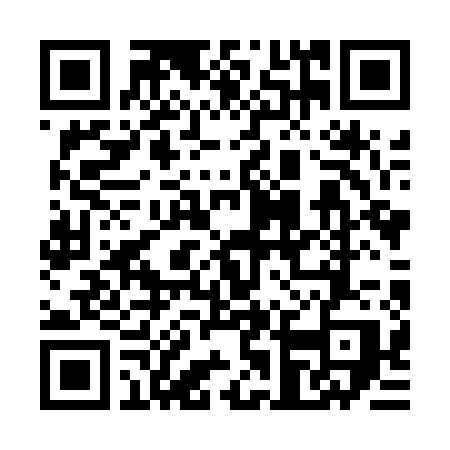

📽️ Download animation video


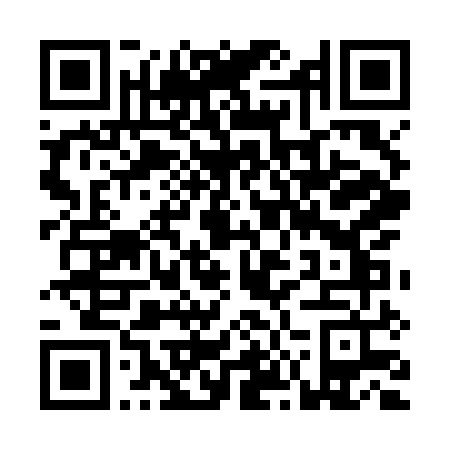

QR Code created. Download PNG here: https://drive.google.com/uc?id=1CWnT0-Oy90tYP1lRVCx8clvTpx98TBlg&export=download
Download MP4 here: https://drive.google.com/uc?id=16WO-0Ex1d0sftNqrfGrNaiFR-iS5IQSv&export=download


In [ ]:
!pip install qrcode[pil]
import os
import qrcode
from google.colab import drive
from google.colab import auth
from googleapiclient.discovery import build
from googleapiclient.http import MediaFileUpload
from IPython.display import Image as IPyImage, display
import shutil # import the shutil module
from io import BytesIO # Import BytesIO from the io module
from PIL import Image # Import Image from PIL

# Authenticate and mount Drive
drive.mount('/content/drive')

# Define file paths
png_filename = f"{variable}_{save_datetime.strftime('%Y-%m-%d_%H%M')}_snapshot.png"
mp4_filename = f"{variable}_{str(year)}_{start_date_str}_{end_date_str}_animation.mp4"

# Define target folder in Drive
drive_folder = "/content/drive/MyDrive/Weather_Animations"
os.makedirs(drive_folder, exist_ok=True)


# Copy files to Drive
shutil.copy(f"/content/{png_filename}", f"{drive_folder}/{png_filename}")
shutil.copy(f"/content/{mp4_filename}", f"{drive_folder}/{mp4_filename}")

print(f"Files copied to your Google Drive folder: {drive_folder}")

# --- Upload & Generate Shareable Link via Google Drive API ---

# Authenticate for API access
auth.authenticate_user()
drive_service = build('drive', 'v3')

def upload_and_share(file_path, filename):
    file_metadata = {
        'name': filename,
        'parents': ['root']  # Saves to My Drive root
    }
    media = MediaFileUpload(file_path, resumable=True)
    uploaded_file = drive_service.files().create(
        body=file_metadata,
        media_body=media,
        fields='id'
    ).execute()

    # Make the file public
    drive_service.permissions().create(
        fileId=uploaded_file['id'],
        body={'role': 'reader', 'type': 'anyone'}
    ).execute()

    file_id = uploaded_file['id']
    return f"https://drive.google.com/uc?id={file_id}&export=download"

# Upload and get URLs
png_url = upload_and_share(f"{drive_folder}/{png_filename}", png_filename)
mp4_url = upload_and_share(f"{drive_folder}/{mp4_filename}", mp4_filename)

# Create QR codes
qr_img_png = qrcode.make(png_url)
qr_img_mp4 = qrcode.make(mp4_url)

# Convert to in-memory image
def display_qr(qr_img, label):
    buf = BytesIO()
    qr_img.save(buf, format='PNG')
    buf.seek(0)
    print(label)
    display(Image.open(buf))

# Display both
display_qr(qr_img_png, "📥 Download PNG snapshot")
display_qr(qr_img_mp4, "📽️ Download animation video")

print(f"QR Code created. Download PNG here: {png_url}")
print(f"Download MP4 here: {mp4_url}")
